# Resevoir computing for the Harmonic Oscillator (1D)

In this notebook we are going to solve the time-dependent Schrödinger equation

$$
i \hbar \frac{d \psi(x,t)}{dt} = \hat{H} \psi(x,t)
$$

for the 1D Harmonic Oscillator system. That is, the Hamiltonian $\hat{H}$ is:

$$
\hat{H}(x) = \frac{p^2}{2m} +  \frac{1}{2} \omega (x - x_0)^2 
$$

In this case we choose $m=\omega=1$ and $x_0=0$. 

Starting from an initial wavefunction $\psi_0(x)$, we will propagate the wavepacket in time. In order to do so, we use a machine learning technique called Reservoir Computing.

##  Reservoir computing<a name="RC" ></a>

Recurrent neural networks (RNN) are a deep learning tool used to deal with sequential data, such as text or time series. Within this context RNNs have proven to give optimal results, due to their ability to keep the knowledge learnt from past data. However, RNNs are known to be computationally expensive during training, and such training may be complicated due to the problem of exploding gradients during back propagation. *Reservoir computing (RC)* is a novel technique which is devoted to solve these problems when working with sequential data.

In the RC framework, the learning complexity of the problem is reduced to performing a linear regression. The key is to design a dynamical system (the internal network) which learns the input-output dynamics. For this reason, the internal states of the network are called *echo states*, since they can be though as an echo of their past. Such internal states are univocally determined by the input and output of the network. The structure of the network is shown in the following figure:


<div>
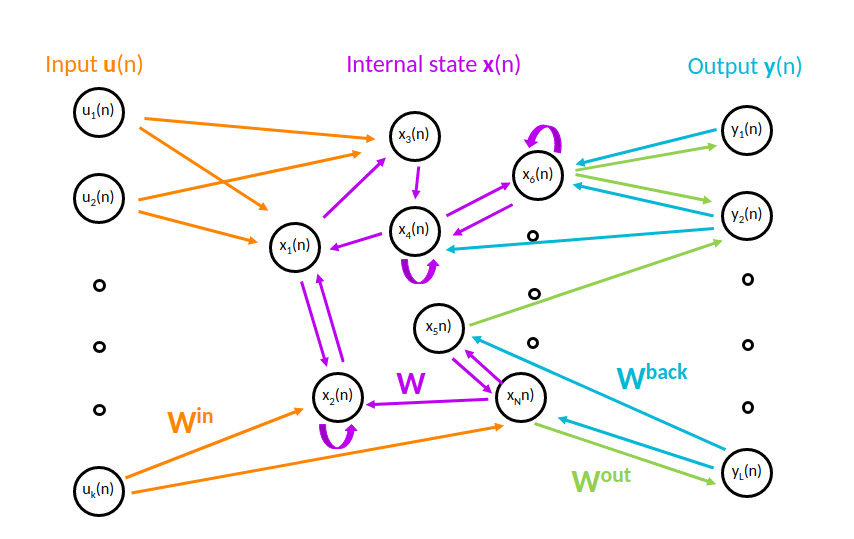
</div>


where
* $W^\text{in}\in M(\mathbb{R})_{N\times K}$, gives the weights from the input units to the internal states. 
* $W\in M(\mathbb{R})_{N\times N}$, gives the weights between the different internal states.
* $W^\text{out}\in M(\mathbb{R})_{L\times N}$, gives the wights from internal states to output units. 
* $W^\text{back}\in M(\mathbb{R})_{N\times L}$, gives the weights from the output units to the internalstates.

and where
* $u(n)=(u_1(n),u_2(n),...,u_K(n)))$ is a $K$-dimensional vector giving the input units at time $n$.
* $x(n)=(x_1(n),x_2(n),...,x_N(n)))$ is an $N$-dimensional vector giving the internal states at time $n$.
* $y(n)=(y_1(n),y_2(n),...,y_L(n)))$ is an $L$-dimensional vector giving the output units at time $n$.

**Remark I:** Notice that the vectors $u(n), x(n)$ and $y(n)$ are discrete time series.

**Remark II:** The weights of the matrices $W^\text{in}$, $W$ and $W^\text{back}$ are fixed, they do not change during training. The only learnable parameters are the weights  $W^\text{out}$. 


during the training phase, the intetnal states $x(n)$ are updated as follows:

$$
x(n)=f(W^\text{in} u(n)+Wx(n-1)+W^\text{back}y(n-1)),
$$ 

where $f$ is the activation function. Usually, $f=\tanh$, which is applied component-wise. On the other hand, the value of the output $y$ is calculated as:

$$
y(n)=f^\text{out}\left(W^\text{out}x(n)\right),
$$

where $f^\text{out}$ is the activation function (usually $f^\text{out}= id$). 

## Training the network<a name="Train" ></a>

The steps to train the network are the following:

+ **1)** Update the internal states by teacher forcing:

$$
x(n) = f((W^\text{in} u(n)+Wx(n-1)+W^\text{back}y_\text{teach}(n-1))
$$

where $y_\text{teach}$ is the true outpt that we want out network to predict.

+ **2)** Discard a transient of $n_\text{min}$ states to guarantee the convergence of the reservoir dynamics.

+ **3)** Find the matrix $W^\text{out}$ by minimizing the mean square error 

$$
MSE(y, y_\text{teach}) = \frac{1}{T - n_\text{min}} \sum_{n=n_\min}^T \Big((f^\text{out})^{-1}(y_\text{teach}(n)) - W^\text{out} x(n)\Big)^2
$$

Notice that this step only requires performing a linear regression.

##  Making predictions<a name="Predict" ></a>

The steps to make the predictions after training the network are the following:

+ **1)** Given an input $u(n)$, update the state of the reservoir:

$$
x(n) = f((^\text{in} u(n)+Wx(n-1)+W^\text{back}y(n-1))
$$

+ **2)** Compute the prediction $y(n)$:

$$
y(n) = f^{out}\Big(W^\text{out} x(n)\Big)
$$

This procedure allows the network to automatically update its internal state and make predictions on its own. However, instead of letting the network make future predictions directly, we first let the network run autonomously for a set of past data. That is, we use the state $x[- t_\text{dismiss}]$ as an initial state and let the network run autonomously. During this process we should obtain similar internal states $x[n]$ and the output $y[n]$ should be similar to $y_\text{teach}[n]$. After these $t_\text{dismiss}$ steps, the network will make predictions to unseen data for $t_\text{autonom}$ steps.

## Tricks to improve learning

There are some tricks which can be used to improve the learning capabilities of the network. Here we list the ones which have been more valuable for us:

### Adding noise<a name="Noise" ></a>

One way to solve the problem of having an ill-conditioned matrix for the linear regression is to add some noise $\nu(n)$ to the output during training. In this case, the formula to update the reservoir internal states will be the following:

$$
x(n) = \tanh((W^\text{in} u(n)+Wx(n-1)+W^\text{back}(y_\text{teach}(n-1) + \nu(n-1))
$$

Adding noise increases the stability of the predictions. The noise will be uniformly sampled from the interval [-0.00001, 0.00001]. We chose these bounds carefully. If the error is too small, it makes no effect. Otherwise, if the error is too big it may give misleading information to the network, and the network may not converge.

###  Ridge regression<a name="Ridge" ></a>

In order to reduce overfitting in the linear prediction, we will add a regularization term to the MSE. Now, the expression which needs to be minimized is the following:

$$
MSE_r(y, y_\text{teach}) = \frac{1}{T - n_\text{min}} \sum_{n=n_\min}^T \Big(f_\text{out}^{-1}(y_\text{teach}(n)) - W^\text{out} x(n)\Big)^2 + \alpha ||W^\text{out}||^2
$$

### Using a constant input<a name="Input" ></a>

Even though the problem does not require to use any input, setting a constant input can help increase the stability of the fit. In this case, we add a constant input $u(n)=u$ of $K$ dimensions.


### Using a long-memory formula to update the reservoir<a name="Formula" ></a>

There are occasions when it is important to keep the knowledge obtained in the distant past. To obtain a long-memory reservoir, a different formula to update the reservoir can be used:

$$
x(n) = (1-Ca)x(n-1)+ C\left[ f\left( W^\text{in}u(n)+Wx(n-1)+W^\text{back}y^\text{teach}(n-1) + \nu(n-1) \right) \right]
$$

where $C$ and $a$ are constants.

In [8]:
#RUN THIS CELL

from IPython.display import HTML, display


HTML('''<script>
function code_toggle() {
 $('.cm-comment:contains(@hidden)').closest('div.input').hide();
} 
$( document ).ready(code_toggle);
</script>''')

#('div.input').show();

In [9]:
# @hidden

from IPython.display import HTML, display
import random as rnd

def hide_toggle(for_next=False, title="Code containing"):
    '''
    HTML function that allows to hide an show code from a specific cell.
    '''
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    show_text = 'Show code'  # text shown on toggle link
    hide_text = 'Hide code'
    toggle_text ='Hide/show'
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(rnd.randint(1,2**64)))

    html = """
        <script>
            function {f_name}(code_show=false) {{
                if (code_show){{
                    {cell_selector}.find('div.input').show();
                }} else{{
                    {cell_selector}.find('div.input').hide();
                }}
            }}

            {js_hide_current}
         </script>
        
        
        <h3 style="margin-bottom: 0.5cm;">{title}</h3>
        <a href="javascript:{f_name}(true)">{show_text}</a>
        <a href="javascript:{f_name}(false)">{hide_text}</a>
        
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        show_text=show_text,
        hide_text=hide_text,
        title = title,
    )
    
    html2 = """
        <script>
           function hide() {{
               {cell_selector}.find('div.input').hide();
           }}
           {js_hide_current}
         </script>   
         
         <script>hide();</script>
    """.format(
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
    )
    return display(HTML(html))

hide_toggle(title = "Function to hide code")

In [10]:
from integrateSchrodinger import IntegrateSchrodinger, calc_norm, empirical_energy1D
from reservoirComputing import ReservoirComputing
from complexRC import ComplexReservoirComputing, ComplexRidge
import numpy as np
import matplotlib.pyplot as plt

import scipy.linalg
from scipy.sparse import random
from scipy.sparse.linalg import eigs
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.metrics import mean_squared_error

import plotly
from plotly.graph_objs import graph_objs as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()

import warnings
warnings.filterwarnings('ignore')

## Training data: Kosloff Fourier method to integrate the Schrodinger equation

In order to train the RC model we need to provide the exact value of the wavefunction $\psi(x,t)$ for a period of time $t \in [0, t_\max]$. Afterwards, the reservoir will evolve autonomously and predict $\psi(x,t)$ for a longer period of time. In order to generate the training data we use the Kosloff method to integrate the Schrödinger equation. 


The dynamics of a one-dimensional quantum system are governed by the time-dependent Schrodinger equation:

$$ i\hbar\frac{\partial \psi}{\partial t} = \frac{-\hbar^2}{2m} \frac{\partial^2 \psi}{\partial x^2} + V \psi $$

The wave function $\psi$ is a function of both position $x$ and time $t$.

A standard way to numerically solve certain differential equations is through the use of the Fourier transform. We'll use a Fourier convention of the following form:

$$ \widetilde{\psi}(k, t) = \frac{1}{\sqrt{2\pi}} \int_{-\infty}^{\infty} \psi(x, t) e^{-ikx} dx $$

Under this convention, the associated inverse Fourier Transform is given by:

$$ \psi(x, t) = \frac{1}{\sqrt{2\pi}} \int_{-\infty}^{\infty} \widetilde{\psi}(k, t) e^{ikx} dk $$

Substituting this into the Schrodinger equation and simplifying gives the Fourier-space form of the Schrodinger equation:

$$ i\hbar\frac{\partial \widetilde{\psi}}{\partial t} = \frac{\hbar^2 k^2}{2m} \widetilde{\psi} + V(i\frac{\partial}{\partial k})\widetilde{\psi} $$

The two versions of the Schrodinger equation contain an interesting symmetry: the time step in each case depends on a straightforward multiplication of the wave function $\psi$, as well as a more complicated term involving derivatives with respect to $x$ or $k$.


## Numerical considerations

Solving this system numerically will require repeated computations of the Fourier transform of $\psi(x, t)$ and the inverse Fourier transform of $\widetilde{\psi}(k, t)$. The best-known algorithm for computation of numerical Fourier transforms is the Fast Fourier Transform (FFT), which is available in scipy and efficiently computes the following form of the discrete Fourier transform:

$$ \widetilde{F_m} = \sum_{n=0}^{N-1} F_n e^{-2\pi i n m / N} $$

and its inverse

$$ F_n = \frac{1}{N} \sum_{m=0}^{N-1} \widetilde{F_m} e^{2\pi i n m / N} $$

We need to know how these relate to the continuous Fourier transforms defined and used above. Let's take the example of the forward transform. Assume that the infinite integral is well-approximated by the finite integral from $a$ to $b$, so that we can write

$$ \widetilde{\psi}(k, t) = \frac{1}{\sqrt{2\pi}} \int_a^b \psi(x, t) e^{-ikx} dx $$

This approximation ends up being equivalent to assuming that the potential $V(x) \to \infty$ at $x \le a$ and $x \ge b$. We'll now approximate this integral as a Riemann sum of $N$ terms, and define $\Delta x = (b - a) / N$, and $x_n = a + n\Delta x$:

$$ \widetilde{\psi}(k, t) \simeq \frac{1}{\sqrt{2\pi}} \sum_{n=0}^{N-1} \psi(x_n, t) e^{-ikx_n} \Delta x $$

This is starting to look like the discrete Fourier transform! To bring it even closer, let's define $k_m = k_0 + m\Delta k$, with $\Delta k = 2\pi / (N\Delta x)$. Then our approximation becomes

$$ \widetilde{\psi}(k_m, t) \simeq \frac{1}{\sqrt{2\pi}} \sum_{n=0}^{N-1} \psi(x_n, t) e^{-ik_m x_n} \Delta x $$

(Note that just as we have limited the range of $x$ above, we have here limited the range of $k$ as well. This means that high-frequency components of the signal will be lost in our approximation. The Nyquist sampling theorem tells us that this is an unavoidable consequence of choosing discrete steps in space, and it can be shown that the spacing we chose above exactly satisfies the Nyquist limit if we choose $k_0 = - \pi / \Delta x$).

Plugging our expressions for $x_n$ and $k_m$ into the Fourier approximation and rearranging, we find the following:

$$ \left[\widetilde{\psi}(k_m, t) e^{i m x_0 \Delta k}\right] \simeq \sum_{n=0}^{N-1} \left[ \frac{\Delta x}{\sqrt{2\pi}} \psi(x_n, t) e^{-ik_0 x_n} \right] e^{-2\pi i m n / N} $$

Similar arguments from the inverse Fourier transform yield:

$$ \left[\frac{\Delta x}{\sqrt{2 \pi}} \psi(x_n, t) e^{-i k_0 x_n}\right] \simeq \frac{1}{N} \sum_{m=0}^{N-1} \left[\widetilde{\psi}(k_m, t) e^{-i m x_0 \Delta k} \right] e^{2\pi i m n / N} $$

Comparing these to the discrete Fourier transforms above, we find that the continuous Fourier pair

$$ \psi(x, t) \Longleftrightarrow \widetilde{\psi}(k, t) $$

corresponds to the discrete Fourier pair

$$ \frac{\Delta x}{\sqrt{2 \pi}} \psi(x_n, t) e^{-i k_0 x_n} \Longleftrightarrow \widetilde{\psi}(k_m, t) e^{i m x_0 \Delta k} $$

subject to the approximations mentioned above. This allows a fast numerical evaluation of the Schrodinger equation.



## The algorithm

Choose $a$, $b$, $N$, sufficient to represent the initial state of the wave function $\psi(x)$. Once these are chosen, then $\Delta x = (b - a) / N$ and $\Delta k = \frac{2\pi}{N\Delta x} $. Define $x_n = a + n \Delta x$ and $k_m = k_0 + m \Delta k$, with $n,m \in \{0, \cdots, N-1\}$. The algorithm works as follows:

1. **Initialization:** Given $\psi(x, 0)$ use a Runge-Kutta method to obtain $\psi(x,dt)$.

2. **Main loop:** 
    + Given $\psi(x,t)$, obtain $\nabla^2 \psi(x,t)$ by:
    
        a) Obtain $\tilde{\psi}(k,t)$ by using the FFT
        
        b) Multiply by -$k^2$ to obtain $\nabla^2$ in the k-space
        
        c) Transform back to the x-space by performing the inverse FFT
        
    + Calculate $\hat{H}\psi = -\frac{\hbar^2}{2m}\nabla^2\psi + V\psi$, where $V\psi$ is an array multiplication
    + Calculate $\psi(x, t+dt) = \psi(x, t-dt) -2idt\hat{H}\psi$

Repeat (2) until we reach the desired time. 

In [11]:
# @hidden 

##################################################################################################################
# Parameters

# specify dt and duration
dt = 0.001
t_max = 60

# specify constants
hbar = 1.0   # planck's constant
m = 1.0      # particle mass
x0=0

# specify range in x coordinate
dx = 0.1
xmin = -10
xmax = 10
x = np.arange(xmin, xmax,dx)
N = x.shape[0]


# Specify potential
# Harmonic oscillator potential
V = 1/2*x*x

# Initial state
psi0 = (1/np.pi)**(1/4)*np.exp(-x**2/2)*np.exp(1j*3.35*x)
norm = calc_norm(psi0, xmin = xmin, xmax = xmax, n_points = N)
psi0 *=norm 

E = np.real(empirical_energy1D(psi0.reshape(1,N), V.reshape(1,N), xmin=xmin, xmax = xmax,
                       n_points=N, hbar=1, m=1))
print('Energy: ', E)

hide_toggle(title = "Parameters Harmonic Oscillator in-between energies")

Energy:  [6.04477673]


In [6]:
# @hidden
#################################################################################################################
# Generate data integrating the Schrodinger equation
S = IntegrateSchrodinger(x, psi0, V, dt=dt)

S.evolve(t_max, store_all=True)

psi = S.psi_x_all
# Calculate energy and norm
V_large = np.repeat(V[np.newaxis,:], psi.shape[0], axis=0)
E = np.real(empirical_energy1D(psi, V_large, xmin=xmin, xmax = xmax,
                       n_points=N, hbar=1, m=1))
norm = np.real([calc_norm(psi[i,:], xmin = xmin, xmax = xmax, n_points = N) 
                for i in range(psi.shape[0])])

hide_toggle(title = "Run to integrate the Schrodinger equation")

In [9]:
with open('../training_data/psi_harmonic.npy', 'wb') as f:
            np.save(f, S.psi_x_all, allow_pickle=True)


In [5]:
with open('../training_data/psi_harmonic.npy', 'rb') as f:
            psi_all = np.load(f, allow_pickle=True)
            
final = psi_all.shape[0]
step = 2
xmin = -10
xmax = 10
dx = 0.1
psi = psi_all[range(0,final,step),:]
x= np.arange(xmin, xmax, dx)
psi.shape

(30001, 200)

## Reservoir computing with complex values

The usual RC framework is done with real numbers. That is, all the inputs $u(n)$ , outputs $y(n)$, internal states $x(n)$ and weight matrices $W, W^\text{in}, W^\text{out}$ are real-valued. However, the wavefunctions are complex values. Therefore, we need to extend the RC framework to complex-valued arrays.  

The extension is pretty straightforward. The update of the internal state consists of matrix multiplications and an application of a non-linear function.

$$
x(n) = f((W^\text{in} u(n)+Wx(n-1)+W^\text{back}y_\text{teach}(n-1))
$$

As long as the function $f$ is defined for complex numbers, the previous equation holds for complex-valued arrays. In this work we propose two activation functions:

+ $f_1(x) = \tanh(x)$

+ $f_2(x) = \tanh(\text{real(x)}) + i \cdot \tanh(\text{im(x)})$

Once the internal states have been calculated, the matrix $W^\text{out}$ is calculated by minimizing the MSE with $L^2$ regularization:

$$
MSE_r(y, y_\text{teach}) = \frac{1}{T - n_\text{min}} \sum_{n=n_\min}^T \Big(f_\text{out}^{-1}(y_\text{teach}(n)) - W^\text{out} x(n)\Big)^2 + \alpha ||W^\text{out}||^2
$$

In matrix form this equation becomes

$$
MSE_r(y, y_\text{teach}) =(f_\text{out}^{-1}(\vec{y}_\text{teach}) - W^\text{out} X)^* \cdot (f_\text{out}^{-1}(\vec{y}_\text{teach}) - W^\text{out} X) + \alpha ||W^\text{out}||^2
$$

Where $^*$ denotes the conjugate transpose and $X$ is the matrix containing the internal states. In the case of real values, the conjugate transpose is just the transpose. Therefore, the analytical solution of the previous equation is:

$$
W^\text{out} = \Big(X^* X + \alpha \mathbb{1}\Big)^{-1} \cdot \Big(X^*f_\text{out}^{-1}(\vec{y}_\text{teach})\Big)
$$

In [6]:
# @hidden
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg
from scipy.sparse import random
from scipy.sparse.linalg import eigs
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.metrics import mean_squared_error
import scipy.sparse
import pickle
import plotly
from plotly.graph_objs import graph_objs as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
from tqdm import tqdm

pyo.init_notebook_mode()

np.random.seed(0)

class ComplexRidge:
    def __init__(self, alpha=0.0001):
        self.alpha = alpha
        
    def fit(self, X, Y):
        # Add bias (column of 1ns)
        X = np.concatenate((np.ones((X.shape[0],1)), X), axis=1)
        X_star = X.conj().T

        inv = scipy.linalg.inv(X_star.dot(X) + self.alpha*np.identity(X.shape[1]))
        self.beta = inv.dot(X_star).dot(Y)
        
    def predict(self, X):
        X = np.concatenate((np.ones((X.shape[0],1)), X), axis=1)
        pred = self.beta.T.dot(X.T).T

        return pred
    
    def mse(self, y_true, y_pred):
        mse = np.real(np.mean(np.conjugate(y_true - y_pred)\
                              *(y_true - y_pred)))
        return mse
    
class ComplexReservoirComputing():
    '''
    Class to define a Reservoir Computing Network. It also contains the functions to calculate the echo states,
    train the network and test it with unseen data.

    Attributes:
        n_min (int): Number of time steps to dismiss
        t_step (int): Number of time steps to let the network evolve
        W_in (sciypy.sparse matrix): (size (N,K)) Input connections
        W_back (scipy.sparse matrix): (size (N,L)) Back connections
        W (scipy.sparse.matrix): (size (N,N)) Reservoir matrix
        L (int): output size
        K (int): input size
        N (int): Number of nodes of the reservoir
        u (np.array): (size t_step,K)) input for training
        y_teach (np.array): (size (t_step,L)) output for training
        initial state (np.array): (size N) initial value of the internal states x(0)
        f (function): Activation function
        f_out (function): Activation function for the output
        states (np.array): Internal states
        predictor (np.array): Learning algorithm
    '''
    def __init__(self, n_min = None, t_step=None, W_in = None, W = None, W_back = None,
                 u = None, y_teach = None, initial_state = None, f = None, f_out = None,
                f_out_inverse =lambda x:x, restore = False, folder='trained_model'):
        
        # Training parameters
        self.n_min = n_min #dismissed time steps (int)
        self.t_step = t_step
        
        if restore:
            self.load(folder)
            
        else:
            # Matrices
            self.W_in = W_in #input connections 
            self.W_back = W_back
            self.W = W #adjacency matrix (matrix of size self.N x self.N)
            
            # Input and output
            self.u = u #input
            self.y_teach = y_teach #desired output of the network

            self.nu = None  # Noise given to the reservoir
            
            self.states = None # matrix containing the internal states of the reservoir:
                            # columns -> nodes; rows -> time steps
                
            self.predictor = None #Linear regressor predictor

        # Dimension values
        self.N = self.W.shape[0] #dimension of the reservoir, i.e, number of nodes (int)
        if self.W_back is not None:
            self.L = self.W_back.shape[1] #dimension of the output (int)
        else:
            self.L = 0
        if self.W_in is not None:
            self.K = self.W_in.shape[1] #dimension of the input (integer) (may be None)
        else:
            self.K = 0
        

        
        self.initial_state = initial_state #initial state of the reservoir
        self.f = f #activation function of the reservoir
        self.f_out = f_out #activation function of the output
        self.f_out_inverse = f_out_inverse # Inverse of the output activation function
    
    
    def evolve_trajectories(self, noise=False, boundary_noise=0.00001,
                            long_formula=False, C=0.49, a=0.9):
        '''
        Function to update the internal states x(n) with time. 
        Attributes:
            noise (boolean): If true, random noise is added to the output
            boundary_noise (float): Upper and lower bounds for the noise
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            
        '''
        # Set initial state
        self.states = self.initial_state
        x_prev = self.initial_state
        
        # If noise==True we add random uniform noise to the output
        if noise and self.y_teach is not None:
            nu = np.random.uniform(low=-boundary_noise, high=boundary_noise,
             size=self.y_teach.shape)
            y = self.y_teach + nu
            self.nu = nu
        else:
            y = self.y_teach
        
        # We update the internal states at each time step
        for n in tqdm(np.arange(self.t_step)):               
            if self.u is None: # If there is no input
                x = self.f(self.W.dot(x_prev) + self.W_back.dot(y[n-1]))
            elif self.y_teach is None: # If there is input but no output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(self.u[n]))
            else: # If there is input and output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(self.u[n]) + self.W_back.dot(y[n-1]))
            if long_formula: # We can also use the long-memory update
                x = (1.-C*a)*x_prev + C*x
            
            # We stack the new internal state
            self.states = np.vstack((self.states,x))
            x_prev = x

        self.states = self.states[1:,:]
    

    def dismiss_initial_states(self):
        '''
        Function to dismiss the n_min initial states
        '''
        self.states = self.states[self.n_min:,:]

    def dismiss_initial_output(self):
        '''
        Function to dismiss the n_min initial outputs
        '''
        self.y_teach = self.y_teach[self.n_min:]
    
    def augmented_x(self, M):
        '''
        Function to crate the vector \tilde{x} = (x, x^2)
        Args:
            M (np.array): Matrix containing the internal states
        Returns:
            (np.array): Augmented internal states
        '''
   
        aux1 = M[:,:int(self.N/2)]
        aux2 = M[:,int(self.N/2):]
    
        return np.hstack((aux1, aux2**2))
    
    
    def train(self, noise=False, boundary_noise=0.00001, ridge=True, alpha = 1e-12, 
              long_formula = False, C=0.49, a=0.9, augmented = False):
        '''
        Function to train the reservoir.
        Args:
            noise (boolean): If true, random noise is added to the output
            ridge (boolean): If ture, a Ridge regression is used instead of a linear regression
            alpha (float): alpha value for the Ridge regression
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            augmented (boolean): If true, the augmented x is used in the fit method
        Returns:
            MSE_vector (np.array): size L. Vector containing the mean square error for each dimension of the ouput
        '''
        
        # 1. Evolve internal states
        self.evolve_trajectories(noise=noise, boundary_noise=boundary_noise, 
                                long_formula = long_formula, C=C, a=a)
        # 2. Dismiss initial states and output
        self.dismiss_initial_states()
        self.dismiss_initial_output()
        # 3. Find W^out
        if ridge: # We can use a Ridge regression instead than a lenar rergression
            lm =  ComplexRidge(alpha=alpha)
        else: # Using a linear regression
            lm = ComplexRidge(alpha=0)
        if augmented: # Using the augmented states (x,x^2)
            lm.fit(self.augmented_x(self.states), self.f_out_inverse(self.y_teach)) # Fit method
            y = self.f_out(lm.predict(self.augmented_x(self.states))) # Predict output
        else:
            lm.fit(self.states, self.f_out_inverse(self.y_teach))  # Fit method
            y = self.f_out(lm.predict(self.states)) # Predict output
            
        #Compute MSE
        MSE_vector = np.mean(np.conjugate(self.y_teach - y)*(self.y_teach - y), axis=1)
        
        self.predictor=lm
        
        return MSE_vector

    
    def test(self, t_autonom=50, t_dismiss=100, u=None, use_W_back=True, y_true=None,
             long_formula=False, C=0.49, a=0.9, augmented = False, update_x = False):
        '''
        Function to test the reservoir with unseen data.
        Args:
            t_autonom (int): Number of time steps used to predict new data
            t_dismiss (int): Dissmissal time steps
            u (np.array): Input for future data
            use_W_back (boolean): If true, we use backwards connections
            y_true (np.array): True new data, used to calculate test MSE
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            augmented (boolean): If true, the augmented x is used in the fit method
       
        Returns:
            y_tot (np.array): predicted y for each time step
            mse (np.array): test mse
        '''
        # Set initial states and outputs to the time t_step-t_dismiss
        x_prev = self.states[-(t_dismiss-1)]
        y =self.y_teach[-(t_dismiss)]
        y_tot=y
        mse=None
        
        # Evolve the internal state for each time
        for n in tqdm(np.arange(t_dismiss + t_autonom)):
            if u is None: # If there is no input
                x = self.f(self.W.dot(x_prev) + self.W_back.dot(y))
            elif use_W_back: # If there is input and output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(u[n]) + self.W_back.dot(y))
            else: # If there is only input
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(u[n]))
            if long_formula: # If we want to use the long-memory formula
                x = (1.-C*a)*x_prev + C*x
                
            x_prev = x
            if augmented: # If we want to use the augmented internal states (x,x^2)
                y = self.f_out(self.predictor.predict(self.augmented_x(x.reshape(1,-1)).reshape(1,-1))[0])
            else:
                y = self.f_out(self.predictor.predict(x.reshape(1,-1))[0]) # Predict output
            y_tot = np.vstack([y_tot,y])
            
            if update_x:
                if n>=t_dismiss: # Update the internal states
                    self.states = np.vstack((self.states,x))
                else: # Add the new internal states
                    self.states[-(t_dismiss-1) + n] = x
        
        y_tot = y_tot[ 1:,:]
        if y_true is not None: # If we have the true output, we calculate the test MSE
            mse= np.mean(np.conjugate(y_true-y_tot[t_dismiss:])*(y_true-y_tot[t_dismiss:]), axis=1)
        return y_tot,mse

    
    def save(self, folder):
        with open(folder + '/states.npy', 'wb') as f:
            np.save(f, self.states)
            
        with open(folder +'/y_teach.npy', 'wb') as f:
            np.save(f, self.y_teach)
        
        with open(folder +'/nu.npy', 'wb') as f:
            np.save(f, self.nu)
            
        with open(folder +'/u.npy', 'wb') as f:
            np.save(f, self.u)
            
        scipy.sparse.save_npz(folder +'/W.npz', self.W)
        scipy.sparse.save_npz(folder +'/W_in.npz', self.W_in)
        scipy.sparse.save_npz(folder +'/W_back.npz', self.W_back)
        pickle.dump(self.predictor, open(folder +'/W_out.sav', 'wb'))

    
    def load(self, folder):
        with open(folder +'/states.npy', 'rb') as f:
            self.states = np.load(f,allow_pickle=True)
        with open(folder +'/y_teach.npy', 'rb') as f:
            self.y_teach = np.load(f,allow_pickle=True)
        with open(folder +'/nu.npy', 'rb') as f:
            self.nu = np.load(f,allow_pickle=True)
        with open(folder +'/u.npy', 'rb') as f:
            self.u = np.load(f,allow_pickle=True)
            
        self.W = scipy.sparse.load_npz(folder +'/W.npz')
        self.W_in = scipy.sparse.load_npz(folder +'/W_in.npz')
        self.W_back = scipy.sparse.load_npz(folder +'/W_back.npz')

        self.predictor = pickle.load(open(folder +'/W_out.sav', 'rb'))

hide_toggle(title = "Reservoir Computing class")

In [38]:
# @hidden
### Parameters of the reservoir
t_step = 6500
n_min = 300
f = lambda x: np.tanh(np.real(x)) + 1j*np.tanh(np.imag(x))
f_out = lambda x: x
f_out_inverse = lambda x: x

N = 2500 # Number of nodes
L = psi.shape[1] # Number of spatial steps (output dimension)
K = 5 # Input dimension
t_autonom = 5000
t_dismiss = 50

### Networks
# 1. Reservoir
def rand(n):
    np.random.seed(0)
    return np.random.choice([-0.5,0.5], n, p = [0.5,0.5])

W = scipy.sparse.random(N,N, density=0.015, random_state=1234, data_rvs = rand)
vaps,_ = eigs(W, k=15)
alpha = np.max(np.abs(vaps))
W = 1.1/alpha*W #Reescale the matrix to reduce the spectral radius

# 2. W^back
def rand2(n):
    np.random.seed(0)
    return np.random.uniform(low=-1, high=1, size=n)

W_back = scipy.sparse.random(N,L, density=1.0, random_state=1234, data_rvs = rand2)

# 3. W^in
def rand3(n):
    np.random.seed(0)
    return np.random.choice([-0.14,0.14], n, p = [0.5,0.5])

W_in = scipy.sparse.random(N,K, density=1.0, random_state=1234, data_rvs = rand3)

# Input
u = 0.1*np.ones((t_step,K))
u_test = 0.1*np.ones((t_autonom + t_dismiss,K))

# Initial states
initial_state = np.ones(N)


# Output
y_teach = psi[:t_step,:]

# Output for prediction
y_true = psi[t_step:t_step + t_autonom,:]

hide_toggle(title = "Reservoir computing parametes")

In [39]:
# Define the newtwork
net = ComplexReservoirComputing(n_min=n_min, t_step=t_step, W_in = W_in, W=W , W_back=W_back,
                         u = u, y_teach=y_teach, initial_state=initial_state, 
                         f=f, f_out=f_out, f_out_inverse = f_out_inverse)

#Train the network
train_mse=net.train(noise=False,boundary_noise=0.02, ridge=True, augmented = False,
                    alpha = 1e-1, long_formula=True, C=0.015, a=0.9)

100%|██████████| 6500/6500 [07:24<00:00, 14.61it/s]


In [ ]:
# Run to load model
net = ComplexReservoirComputing(n_min=n_min, t_step=t_step, f=f, f_out=f_out, 
                         restore = True, folder='trained_models/1D/harmonic')

In [40]:
# test network
y_pred,test_mseRC = net.test(t_autonom,t_dismiss, u=u_test, y_true=y_true, 
                           augmented = False, long_formula=True,
                           C=0.015, a=0.9, update_x=False)

100%|██████████| 5050/5050 [00:47<00:00, 106.75it/s]


In [44]:
print("Train mean MSE = {}".format(np.real(np.mean(train_mse))))
print("Test mean MSE = {}".format(np.abs(np.real(np.mean(test_mseRC)))))

Train mean MSE = 1.602089935702765e-10
Test mean MSE = 5.747334498726088e-05


In [42]:
# Save model
net.save('../trained_models/1D/harmonic')

In [43]:
with open('../results/1D/harmonic_predRC.npy', 'wb') as f:
            np.save(f, y_pred, allow_pickle=True)
        
with open('../results/1D/harmonic_trueRC.npy', 'wb') as f:
            np.save(f, y_true, allow_pickle=True)
        
with open('../results/1D/harmonic_teachRC.npy', 'wb') as f:
            np.save(f, y_teach, allow_pickle=True)

In [359]:
# @hidden
from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
plt.ioff()

n = y_pred.shape[1]

V_large = np.repeat(V[np.newaxis,:], y_pred.shape[0], axis=0)
E = np.real(empirical_energy1D( y_pred, V_large, xmin = xmin, xmax = xmax,
                       n_points=x.shape[0], hbar=1, m=1))
norm = np.real([calc_norm(y_pred[i,:],  xmin = xmin, xmax = xmax, n_points = x.shape[0]) 
                for i in range(y_pred.shape[0])])


# Steps to display the wavefunction. i.e we display psi(i*display)
interval=1

# Define figure axis and size
fig, (ax1, ax3, ax5) = plt.subplots(3, figsize=(7,10))
# Plot data
ln1, = ax1.plot([], [], lw=2, color='blue')
ln1_p, = ax1.plot([], [], lw=2, color='red')
# Secondary axis for potential
ax2 = ax1.twinx()
ln2, = ax2.plot(x, V, lw=2, color='green')
ln = ln1
# Title
title = ax1.set_title("")
ax1.legend((ln1, ln1_p, ln2), ('True', 'Predicted', 'Potential'), loc='upper right')

# Imaginary part
ln3, = ax3.plot([], [], lw=2, color='blue')
ln3_p, = ax3.plot([], [], lw=2, color='red')
# Secondary axis for potential
ax4 = ax3.twinx()
ln4, = ax4.plot(x, V, lw=2, color='green')
# Title
title2 = ax3.set_title("")
ax3.legend((ln3, ln3_p, ln4), ('True', 'Predicted', 'Potential'), loc='upper right')

# Modulus
ln5, = ax5.plot([], [], lw=2, color='blue')
ln5_p, = ax5.plot([], [], lw=2, color='red')
# Secondary axis for potential
ax6 = ax5.twinx()
ln6, = ax6.plot(x, V, lw=2, color='green')
# Title
title3 = ax5.set_title("")
ax5.legend((ln5, ln5_p, ln6), ('True', 'Predicted', 'Potential'), loc='upper right')


# Conservation of energy and momentum text
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
textstr = '\n'.join((
    r'$E=%.2f$' % (E[0], ),
    r'$|\psi|^2=%.2f$' % (norm[0], )))
conservation = ax1.text(0.06, 0.96, textstr, transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

fig.tight_layout(pad=3.0)



def init():
    # Real
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(-1+ E[0], 1+ E[0])
    ax1.set_yticks(np.arange(-1, 1.4, step=0.4)+ E[0] )
    ax1.set_yticklabels(('-1.0', '-0.6', '-0.2', '0.2', '0.6', '1.0' ))
    ax2.set_ylim(0, 13)
    # Imaginary
    ax3.set_xlim(xmin, xmax)
    ax3.set_ylim(-1+ E[0], 1+ E[0])
    ax3.set_yticks(np.arange(-1, 1.4, step=0.4)+ E[0] )
    ax3.set_yticklabels(('-1.0', '-0.6', '-0.2', '0.2', '0.6', '1.0' ))
    ax4.set_ylim(0, 13)
    # Modulus
    ax5.set_xlim(xmin, xmax)
    ax5.set_ylim(-1+ E[0], 1+ E[0])
    ax5.set_yticks(np.arange(-1, 1.4, step=0.4)+ E[0] )
    ax5.set_yticklabels(('-1.0', '-0.6', '-0.2', '0.2', '0.6', '1.0' ))
    ax6.set_ylim(0, 13)

    return ln,

def update(i):
    xdata = x
    # Real axis
    psi_true = np.real(y_true[i,:]) +  E[0]
    psi_pred = np.real(y_pred[i + t_dismiss,:n]) + E[0]
    ln1.set_data(xdata, psi_true)
    ln1_p.set_data(xdata, psi_pred)
    title.set_text("Real t = {:.2f}".format(dt*i*interval))
    conservation.set_text('\n'.join((
        r'$E=%.2f$' % (E[i], ),
        r'$|\psi|^2=%.2f$' % (norm[i], ))))
    
    # Imaginary axis
    psi_true = np.imag(y_true[i,:]) +  E[0]
    psi_pred = np.imag(y_pred[i + t_dismiss,:]) +  E[0]
    ln3.set_data(xdata, psi_true)
    ln3_p.set_data(xdata, psi_pred)
    title2.set_text("Imaginary t = {:.2f}".format(dt*i*interval))
    
    # Modulus axis
    psi_true = np.real(np.conjugate(y_true[i,:])*y_true[i,:]) +  E[0]
    psi_pred = np.real(np.conjugate(y_pred[i + t_dismiss,:])\
                       *y_pred[i + t_dismiss,:]) +  E[0]
    ln5.set_data(xdata, psi_true)
    ln5_p.set_data(xdata, psi_pred)
    title3.set_text("Modulus t = {:.2f}".format(dt*i*interval))

    return ln,ln1,ln2,ln3,ln4,ln5,ln6, title, title2, title3, conservation

ani = FuncAnimation(fig, update, interval=30, frames=y_true.shape[0],
                    init_func=init, blit=True)
display(HTML(ani.to_html5_video()))
plt.close(fig)

hide_toggle(title = "Animation")

## Multi reservoir Computing

In [24]:
# @hidden

import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg
from scipy.sparse import random
from scipy.sparse.linalg import eigs
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.metrics import mean_squared_error
import scipy.sparse
import pickle
import plotly
from plotly.graph_objs import graph_objs as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
from tqdm import tqdm
pyo.init_notebook_mode()

np.random.seed(0)

class ComplexRidge:
    def __init__(self, alpha=0.0001):
        self.alpha = alpha
        
    def fit(self, X, Y):
        # Add bias (column of 1ns)
        X = np.concatenate((np.ones((X.shape[0],1)), X), axis=1)
        X_star = X.conj().T

        inv = scipy.linalg.inv(X_star.dot(X) + self.alpha*np.identity(X.shape[1]))
        self.beta = inv.dot(X_star).dot(Y)
        
    def predict(self, X):
        X = np.concatenate((np.ones((X.shape[0],1)), X), axis=1)
        pred = self.beta.T.dot(X.T).T

        return pred
    
    def mse(self, y_true, y_pred):
        mse = np.real(np.mean(np.conjugate(y_true - y_pred)\
                              *(y_true - y_pred)))
        return mse
    
class MultiReservoirComputing():
    '''
    Class to define a Reservoir Computing Network. It also contains the functions to calculate the echo states,
    train the network and test it with unseen data.

    Attributes:
        n_min (int): Number of time steps to dismiss
        t_step (int): Number of time steps to let the network evolve
        W_in (sciypy.sparse matrix): (size (N,K)) Input connections
        W_back (scipy.sparse matrix): (size (N,L)) Back connections
        W (scipy.sparse.matrix): (size (N,N)) Reservoir matrix
        L (int): output size
        K (int): input size
        N (int): Number of nodes of the reservoir
        u (np.array): (size t_step,K)) input for training
        y_teach (np.array): (size (t_step,L)) output for training
        initial state (np.array): (size N) initial value of the internal states x(0)
        f (function): Activation function
        f_out (function): Activation function for the output
        states (np.array): Internal states
        predictor (np.array): Learning algorithm
    '''
    def __init__(self, n_min = None, t_step=None, W_in = None, W = None, W_back = None,
                 u = None, y_teach = None, initial_state = None, f = None, f_out = None,
                f_out_inverse =lambda x:x, restore = False, folder='trained_model'):
        
        # Training parameters
        self.n_min = n_min #dismissed time steps (int)
        self.t_step = t_step
        
        if restore:
            self.load(folder)
            
        else:
            # Matrices
            self.W_in = W_in #input connections 
            self.W_back = W_back
            self.W = W #adjacency matrix (matrix of size self.N x self.N)
            
            # Input and output
            self.u = u #input
            self.y_teach = y_teach #desired output of the network

            self.nu = None  # Noise given to the reservoir
            
            self.states = None # matrix containing the internal states of the reservoir:
                            # columns -> nodes; rows -> time steps
                
            self.predictor = None #Linear regressor predictor

        # Dimension values
        self.N = self.W.shape[0] #dimension of the reservoir, i.e, number of nodes (int)
        if self.W_back is not None:
            self.L = self.W_back.shape[1] #dimension of the output (int)
        else:
            self.L = 0
        if self.W_in is not None:
            self.K = self.W_in.shape[1] #dimension of the input (integer) (may be None)
        else:
            self.K = 0
        

        
        self.initial_state = initial_state #initial state of the reservoir
        self.f = f #activation function of the reservoir
        self.f_out = f_out #activation function of the output
        self.f_out_inverse = f_out_inverse # Inverse of the output activation function
        self.states = None
    
    def evolve_trajectories(self, time_in, time_fin, y_teach = None, noise=False, boundary_noise=0.00001,
                            long_formula=False, C=0.49, a=0.9):
        '''
        Function to update the internal states x(n) with time. 
        Attributes:
            noise (boolean): If true, random noise is added to the output
            boundary_noise (float): Upper and lower bounds for the noise
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            
        '''
        # Set initial state
        if self.states is None:
            cut=True
            self.states = self.initial_state
            x_prev = self.initial_state
        else:
            cut=False
            x_prev = self.states[-1]
        
        # If noise==True we add random uniform noise to the output
        if noise and self.y_teach is not None:
            nu = np.random.uniform(low=-boundary_noise, high=boundary_noise,
             size=y_teach.shape)
            y = y_teach + nu
            self.nu = nu
        else:
            y = self.y_teach
        
        # We update the internal states at each time step
        for n in tqdm(range(time_in, time_fin)):               
            if self.u is None: # If there is no input
                x = self.f(self.W.dot(x_prev) + self.W_back.dot(y[n-1]))
            elif self.y_teach is None: # If there is input but no output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(self.u[n]))
            else: # If there is input and output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(self.u[n]) + self.W_back.dot(y[n-1]))
            if long_formula: # We can also use the long-memory update
                x = (1.-C*a)*x_prev + C*x
            
            # We stack the new internal state
            self.states = np.vstack((self.states,x))
            x_prev = x

        if cut:
            self.states = self.states[1:,:]
        
    def dismiss_initial_states(self):
        '''
        Function to dismiss the n_min initial states
        '''
        self.states = self.states[self.n_min:,:]

    def dismiss_initial_output(self):
        '''
        Function to dismiss the n_min initial outputs
        '''
        self.y_teach = self.y_teach[self.n_min:]
    
    def augmented_x(self, M):
        '''
        Function to crate the vector \tilde{x} = (x, x^2)
        Args:
            M (np.array): Matrix containing the internal states
        Returns:
            (np.array): Augmented internal states
        '''
   
        aux1 = M[:,:int(self.N/2)]
        aux2 = M[:,int(self.N/2):]
    
        return np.hstack((aux1, aux2**2))
    
    
    def train(self, noise=False, boundary_noise=0.00001, ridge=True, alpha = 1e-12, 
              long_formula = False, C=0.49, a=0.9, augmented = False, frac=0.85):
        '''
        Function to train the reservoir.
        Args:
            noise (boolean): If true, random noise is added to the output
            ridge (boolean): If ture, a Ridge regression is used instead of a linear regression
            alpha (float): alpha value for the Ridge regression
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            augmented (boolean): If true, the augmented x is used in the fit method
        Returns:
            MSE_vector (np.array): size L. Vector containing the mean square error for each dimension of the ouput
        '''
        # Separate y_teach in two blocks
        self.y_teach1 = self.y_teach[:int(self.t_step*frac)]
        self.y_teach2 = self.y_teach[int(self.t_step*frac):]
        
        # 1. Evolve internal states
        self.evolve_trajectories(0, int(self.t_step*frac),self.y_teach1, noise=noise, boundary_noise=boundary_noise, 
                                long_formula = long_formula, C=C, a=a)
        # States size
        states_old = self.states.copy()
        # 3. Find W^out
        if ridge: # We can use a Ridge regression instead than a lenar rergression
            lm =  ComplexRidge(alpha=alpha)
        else: # Using a linear regression
            lm = ComplexRidge(alpha=0)
        if augmented: # Using the augmented states (x,x^2)
            lm.fit(self.augmented_x(self.states), self.f_out_inverse(self.y_teach1)) # Fit method
        else:
            lm.fit(self.states, self.f_out_inverse(self.y_teach1))  # Fit method

        self.predictor=lm
        # Evolve reservoir with test data
        if frac<1:
            yp,mse = self.test(t_autonom=self.t_step, t_autonom0 =int(self.t_step*frac), t_dismiss=0, 
                               u=self.u, use_W_back=True, y_true=self.y_teach2, train=True,
                               long_formula = long_formula, C=C, a=a, augmented = augmented, update_x = True)
            
            # Retrain predictor
            if augmented: # Using the augmented states (x,x^2)
                lm.fit(self.augmented_x(self.states), self.f_out_inverse(self.y_teach)) # Fit method
                y = self.f_out(lm.predict(self.augmented_x(self.states))) # Predict output
            else:
                lm.fit(self.states, self.f_out_inverse(self.y_teach))  # Fit method
                y = self.f_out(lm.predict(self.states)) # Predict output
                   
            self.states = states_old
            self.evolve_trajectories(int(self.t_step*frac), self.t_step , self.y_teach, noise=noise, boundary_noise=boundary_noise, 
                                    long_formula = long_formula, C=C, a=a)
            lm.fit(self.states, self.f_out_inverse(self.y_teach))
        else:
            y = self.f_out(lm.predict(self.states))
        
        #Compute MSE
        MSE_vector = np.mean(np.conjugate(self.y_teach - y)*(self.y_teach - y), axis=1)
        
        return MSE_vector

    
    def test(self, t_autonom=50,t_dismiss=100, t_autonom0=0, train=False, u=None, use_W_back=True, y_true=None,
             long_formula=False, C=0.49, a=0.9,
             augmented = False, update_x = False, step_chaos=10000):
        '''
        Function to test the reservoir with unseen data.
        Args:
            t_autonom (int): Number of time steps used to predict new data
            t_dismiss (int): Dissmissal time steps
            u (np.array): Input for future data
            use_W_back (boolean): If true, we use backwards connections
            y_true (np.array): True new data, used to calculate test MSE
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            augmented (boolean): If true, the augmented x is used in the fit method
       
        Returns:
            y_tot (np.array): predicted y for each time step
            mse (np.array): test mse
        '''
        # Set initial states and outputs to the time t_step-t_dismiss
        if train:
            x_prev = self.states[-1]
            y = self.y_teach1[-1]
        else:    
            x_prev = self.states[-(t_dismiss-1)]
            y =self.y_teach[-(t_dismiss)]
        y_tot=y
        mse=None
        
        # Evolve the internal state for each time
        for n in tqdm(range(t_autonom0, t_dismiss + t_autonom)):
            if u is None: # If there is no input
                x = self.f(self.W.dot(x_prev) + self.W_back.dot(y))
            elif use_W_back: # If there is input and output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(u[n]) + self.W_back.dot(y))
            else: # If there is only input
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(u[n]))
            if long_formula: # If we want to use the long-memory formula
                x = (1.-C*a)*x_prev + C*x
                
            x_prev = x
            if augmented: # If we want to use the augmented internal states (x,x^2)
                y = self.f_out(self.predictor.predict(self.augmented_x(x.reshape(1,-1)).reshape(1,-1))[0])
            else:
                y = self.f_out(self.predictor.predict(x.reshape(1,-1))[0]) # Predict output
            if n%step_chaos<2 and n>=t_dismiss:
                y_tot = np.vstack([y_tot,y])
                y = y_true[n - t_dismiss-t_autonom0]
            else:    
                y_tot = np.vstack([y_tot,y])
            
            if update_x:
                if n>=t_dismiss: # Update the internal states
                    self.states = np.vstack((self.states,x))
                else: # Add the new internal states
                    self.states[-(t_dismiss-1) + n] = x
        
        y_tot = y_tot[ 1:,:]
        if y_true is not None: # If we have the true output, we calculate the test MSE
            mse= np.mean(np.conjugate(y_true-y_tot[t_dismiss:])*(y_true-y_tot[t_dismiss:]), axis=1)
        return y_tot,mse

    
    def save(self, folder):
        with open(folder + '/states.npy', 'wb') as f:
            np.save(f, self.states)
            
        with open(folder +'/y_teach.npy', 'wb') as f:
            np.save(f, self.y_teach)
        
        with open(folder +'/nu.npy', 'wb') as f:
            np.save(f, self.nu)
            
        with open(folder +'/u.npy', 'wb') as f:
            np.save(f, self.u)
            
        scipy.sparse.save_npz(folder +'/W.npz', self.W)
        scipy.sparse.save_npz(folder +'/W_in.npz', self.W_in)
        scipy.sparse.save_npz(folder +'/W_back.npz', self.W_back)
        pickle.dump(self.predictor, open(folder +'/W_out.sav', 'wb'))

    
    def load(self, folder):
        with open(folder +'/states.npy', 'rb') as f:
            self.states = np.load(f,allow_pickle=True)
        with open(folder +'/y_teach.npy', 'rb') as f:
            self.y_teach = np.load(f,allow_pickle=True)
        with open(folder +'/nu.npy', 'rb') as f:
            self.nu = np.load(f,allow_pickle=True)
        with open(folder +'/u.npy', 'rb') as f:
            self.u = np.load(f,allow_pickle=True)
            
        self.W = scipy.sparse.load_npz(folder +'/W.npz')
        self.W_in = scipy.sparse.load_npz(folder +'/W_in.npz')
        self.W_back = scipy.sparse.load_npz(folder +'/W_back.npz')

        self.predictor = pickle.load(open(folder +'/W_out.sav', 'rb'))

hide_toggle(title = "Multi Reservoir Computing class")

In [25]:
# Define the newtwork
net = MultiReservoirComputing(n_min=n_min, t_step=t_step, W_in = W_in, W=W , W_back=W_back,
                         u = u, y_teach=y_teach, initial_state=initial_state, 
                         f=f, f_out=f_out, f_out_inverse = f_out_inverse)

#Train the network
train_mse=net.train(noise=False,boundary_noise=0.02, ridge=True, augmented = False,
                    alpha = 1e-1, long_formula=True, C=0.05, a=0.9)

100%|██████████| 975/975 [02:16<00:00,  7.15it/s]


In [26]:
# test network
y_pred,test_mseMRC = net.test(t_autonom,t_dismiss, u=u_test, y_true=y_true, 
                           augmented = False, long_formula=True,
                           C=0.05, a=0.9, update_x=False)

100%|██████████| 5050/5050 [01:02<00:00, 80.25it/s]


In [381]:
print("Train mean MSE = {}".format(np.real(np.mean(train_mse))))
print("Test mean MSE = {}".format(np.abs(np.real(np.mean(test_mseMRC)))))

Train mean MSE = 1.5511344325654027e-10
Test mean MSE = 2.3270792977942573e-05


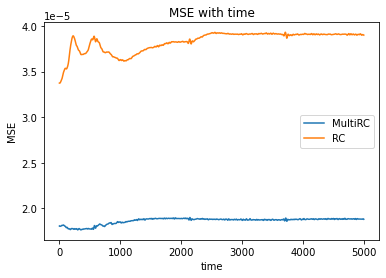

In [35]:
plt.plot(np.real(test_mseMRC), label='MultiRC')
plt.plot(np.real(test_mseRC), label='RC')
plt.title('MSE with time')
plt.xlabel('time')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [36]:
# Save model
net.save('../trained_models/1D/Multi_RC/harmonic')

In [37]:
with open('../results/1D/harmonic_predMRC.npy', 'wb') as f:
            np.save(f, y_pred, allow_pickle=True)
        
with open('../results/1D/harmonic_trueMRC.npy', 'wb') as f:
            np.save(f, y_true, allow_pickle=True)
        
with open('../results/1D/harmonic_teachMRC.npy', 'wb') as f:
            np.save(f, y_teach, allow_pickle=True)

## Obtaining the eigenfunctions

Once we have the time evolution of the wavefunctions we can calculate some of the eigenfunctions of the system. These wavefunctions have similiar eigen energies as the initial energy of the wavepacket. 

## Energy spectrum

We will calculate the energy spectrum of the true and predicted wavefunctions so as to find the eigen energies and eigen states.

The time-correlation function is defined as:

$$
A(t) = <\psi(t)|\psi(0)> = \int_x \psi(t)^* \psi(0) dx
$$

Then, the energy spectrum is the Fourier transform of the time-correlation function:

$$
I(E) = \int_t A(t) e^{-i E t/ \hbar} dt
$$

In [45]:
# @hidden

def time_correlation(psi_t, psi_0, xmin=-5, xmax=5):
    N = psi_0.shape[0]
    h = (xmin-xmax)/N
    A = np.sum(np.conjugate(psi_t)*psi_0*h)
    return A

def time_correlation_function(psi, xmin=-5, xmax=5):
    A = np.array([time_correlation(psi[i], psi[0], \
                 xmin=xmin, xmax=xmax) for i in range(psi.shape[0])])
    return A

def energy_spectrum(A, dt,t_max, E, hbar=1):
    t = np.arange(0, t_max, dt)
    I = np.sum(A*np.exp(-1j/hbar*E*t)*dt)
    return I

def energy_spectrum_function(A, dt, t_max, Emin=0, Emax=20, dE=0.05):
    E = np.arange(Emin, Emax, dE)
    I = np.array([energy_spectrum(A, dt,t_max, E[i])  
                  for i in range(E.shape[0])])
    return I
hide_toggle(title = "Code for energy spectrum")    

In [73]:
# With complex RC
psi_pred = np.concatenate((y_teach, y_pred[t_dismiss:,]), axis=0)
psi_true = np.concatenate((y_teach, y_true), axis=0)

In [74]:
A_true = time_correlation_function(psi_true, xmin=-10, xmax=10)
A_pred = time_correlation_function(psi_pred, xmin=-10, xmax=10)

In [75]:
dt=0.001*2
t_max = psi_true.shape[0]*dt
Emin=0
Emax=15
dE=0.01
I_true = energy_spectrum_function(A_true, dt, t_max,
                                  Emin=Emin, Emax=Emax,dE=dE)
I_pred = energy_spectrum_function(A_pred, dt, t_max,
                                  Emin=Emin, Emax=Emax,dE=dE)

In [82]:
with open('../results/1D/eigenfunctions/I_true_harmonic.npy', 'wb') as f:
            np.save(f, I_true, allow_pickle=True)
        
with open('../results/1D/eigenfunctions/I_pred_harmonic.npy', 'wb') as f:
            np.save(f, I_pred, allow_pickle=True)

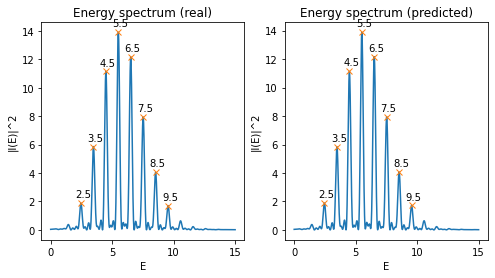

In [78]:
# @hidden

from scipy.signal import find_peaks

I_true_mod =  np.real(np.conjugate(I_true)*I_true)
peaks_true, _ = find_peaks(I_true_mod, height=1.5)

I_pred_mod =  np.real(np.conjugate(I_pred)*I_pred)
peaks_pred, _ = find_peaks(I_pred_mod, height=1.5)
E = np.arange(Emin, Emax, dE)

# PLOT
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8,4))
ax1.plot(E,I_true_mod)
ax1.plot(E[peaks_true], I_true_mod[peaks_true], "x")
ax1.set_title("Energy spectrum (real)")
ax1.set_xlabel("E")
ax1.set_ylabel("|I(E)|^2")

for i in range(peaks_true.shape[0]):
    ax1.text(E[peaks_true][i]-0.5, I_true_mod[peaks_true][i]+0.4,
             round(E[peaks_true][i],1), fontsize=10)

ax2.plot(E,I_pred_mod)
ax2.plot(E[peaks_pred], I_pred_mod[peaks_pred], "x")
ax2.set_title("Energy spectrum (predicted)")
ax2.set_xlabel("E")
ax2.set_ylabel("|I(E)|^2")
for i in range(peaks_pred.shape[0]):
    ax2.text(E[peaks_pred][i]-0.5, I_true_mod[peaks_pred][i]+0.4,
             round(E[peaks_pred][i],1), fontsize=10)
plt.show()

hide_toggle(title = "Energy spectrum")

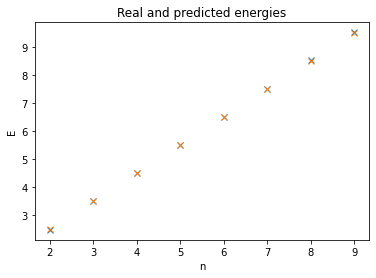

In [79]:
# @hidden

omega=1
hbar=1
n = np.arange(2,10)
E_real = hbar*omega*(n+1/2)

plt.plot(n, E[peaks_pred], 'x', label="Predicted")
plt.plot(n, E_real, 'x', label="Real")
plt.title('Real and predicted energies')
plt.xlabel('n')
plt.ylabel('E')
plt.show()
hide_toggle(title = "Real and predicted energies")

## Eigenstates

The eigenstates of the Hamiltonian are then:

$$
\phi_n(x) = \int_t \psi(x,t) e^{-i E_n t/\hbar} dt
$$

In [80]:
# @hidden
from scipy.special import eval_hermite

# Empirical wavefunctions
En = E[peaks_pred]
t = np.arange(0, t_max, dt)

def eigenfunctions_emp(psi_pred, E,t,dt,x):
    phi_E= np.array([np.sum(psi_pred[:,i]*np.exp(1j*E*t)*dt)
              for i in range(psi_pred.shape[1])])
    h = (x[-1] - x[0])/x.shape[0]
    C = 1/np.sqrt(np.sum(np.conjugate(phi_E)*phi_E*h))
    return phi_E*C

phi_n = np.array([eigenfunctions_emp(psi_pred, En[j],t,dt,x)
                  for j in range(En.shape[0])])

# Harmonic oscillator true wavefunctions
def HO_wavefunction(n=0, hbar=1, m=1, omega=1):
    sigma_inv = np.sqrt(m*omega/hbar)
    all_x = (x -x0)*sigma_inv 
    herm = eval_hermite(n, all_x) # H_n(x/sigma)
    exp = np.exp(- all_x**2/2) # Exponential term
    phi_n = exp*herm
    h = (x[-1] - x[0])/x.shape[0]
    C = 1/np.sqrt(np.sum(phi_n*phi_n*h))
    return phi_n*C

phis = []
for k in range(2,En.shape[0]+2):
    phis.append(HO_wavefunction(n=k))
    
hide_toggle(title = "Calculate the real and predicted wavefunctions")

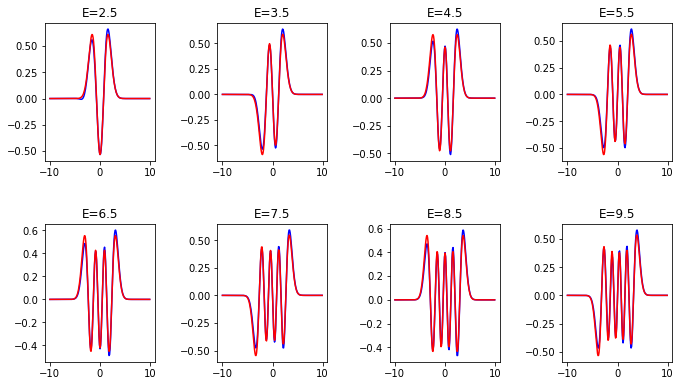

In [81]:
# @hidden

fig, ax = plt.subplots(2,4, figsize=(10,6))

h = (x[-1] - x[0])/x.shape[0]
phis_pred = []
for k in range(En.shape[0]):
    i = int(k/4)
    j = k%4
    mse= np.sum((np.real(phi_n[k])-phis[k])**2)
    mse_inv= np.sum((-np.real(phi_n[k])-phis[k])**2)
    mse_im= np.sum((np.imag(phi_n[k])-phis[k])**2)
    mse_im_inv= np.sum((-np.imag(phi_n[k])-phis[k])**2)
    min_mse=np.min([mse, mse_inv, mse_im, mse_im_inv])
    if mse==min_mse:
        C = 1/np.sqrt(np.sum(np.real(phi_n[k])*np.real(phi_n[k])*h))
        phi = C*np.real(phi_n[k])
        ax[i][j].plot(x, phi, label='Predicted',color="blue")
    elif mse_inv==min_mse:
        C = 1/np.sqrt(np.sum(np.real(phi_n[k])*np.real(phi_n[k])*h))
        phi = -C*np.real(phi_n[k])
        ax[i][j].plot(x, phi, label='Predicted',color="blue")
    elif mse_im==min_mse:
        C = 1/np.sqrt(np.sum(np.imag(phi_n[k])*np.imag(phi_n[k])*h))
        phi = C*np.imag(phi_n[k])
        ax[i][j].plot(x, phi, label='Predicted',color="blue")
    elif mse_im_inv==min_mse:
        C = 1/np.sqrt(np.sum(np.imag(phi_n[k])*np.imag(phi_n[k])*h))
        phi = -C*np.imag(phi_n[k])
        ax[i][j].plot(x, phi, label='Predicted',color="blue")
    phis_pred.append(phi)
    ax[i][j].plot(x, phis[k], label='Real', color="red")
   # ax[i][j].legend()
    ax[i][j].set_title("E={}".format(round(En[k],1)))

plt.tight_layout(pad=3)
plt.show()
hide_toggle(title = "Real and predicted wavefunctions")

We see that using the RC model we can calculate the eigenfunctions of the systems.

In [54]:
mse_waves = []
for k in range(En.shape[0]):
    mse_waves.append(np.mean(np.conjugate(phis[k] - phis_pred[k])*(phis[k] - phis_pred[k])))
    
print('Mean square error wavefunctions: \n', np.round(mse_waves,5)) 

Mean square error wavefunctions: 
 [4.e-05 4.e-05 4.e-05 4.e-05 4.e-05 4.e-05 4.e-05 5.e-05]


In [88]:
with open('../results/1D/eigenfunctions/phis_true_harmonic.npy', 'wb') as f:
            np.save(f, np.array(phis), allow_pickle=True)
        
with open('../results/1D/eigenfunctions/phis_pred_harmonic.npy', 'wb') as f:
            np.save(f, np.array(phis_pred), allow_pickle=True)